In [1]:
import torch
from copy import copy

from experiments.experiment import Experiment
from experiments.parser import get_parser
from rvae.utils.save_utils import load_model
from rvae.vizualization.visualization import (
    plot_brownian_motion,
    plot_variance,
)
from rvae.utils.paths import RESULTS_PATH

# from rvae.vizualization.visualization_new import plot_latent_space

parser = get_parser()
args = parser.parse_args(
    args=[
        "--model",
        "RVAE",
        "--dataset",
        "fmnist",
        "--enc_layers",
        "300",
        "300",
        "--dec_layers",
        "300",
        "300",
        "--latent_dim",
        "2",
        "--num_centers",
        "350",
        "--num_components",
        "1",
        "--device",
        "cpu",
        "--ckpt_path",
        # "/home/prz/PROJECTS/rvae_reproduction/saved_models/RVAE/fmnist_warmup",
        "/home/prz/PROJECTS/rvae_reproduction/saved_models/RVAE/fmnist_epoch100ckpt",
        # "/home/prz/PROJECTS/rvae_reproduction/saved_models/d2/RVAE/fmnist_epoch100ckpt",
    ]
)
exp = Experiment(args)
exp.load_just_model(pretrained_path=args.ckpt_path)

DEBUG: self.rvae_save_dir='../saved_models/RVAE/' | os.path.exists(self.rvae_save_dir)=True


/home/prz/PROJECTS/rvae_reproduction/rvae/utils/save_utils.py:28: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(load_path, map_location="cpu")


In [2]:
exp.model._mean_warmup = False
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [3]:
from rvae.vizualization.visualization_new import (
    create_base_plot,
    compute_geodesic_and_linear,
    overlay_geodesic_on_plot,
    get_interpolated_images,
    compare_interpolations,
)

fig, samples_np, labels_np, idxs = create_base_plot(
    exp.model,
    exp.train_loader,
    # exp.test_loader,
    side=110,
    step=1,
    device=device,
    log_scale=True,
)

Embedding datapoints: 600it [00:15, 38.98it/s]


In [2]:
fig

NameError: name 'fig' is not defined

In [7]:
# train
sample_idxs = [22204, 48094]

c_pts, lin_pts = compute_geodesic_and_linear(
    model=exp.model,
    sample1=torch.tensor(samples_np[sample_idxs[0]]),
    sample2=torch.tensor(samples_np[sample_idxs[1]]),
)

overlay_geodesic_on_plot(fig=copy(fig), c_pts=c_pts, lin_pts=lin_pts)

Optimizing Geodesic: 100%|██████████| 500/500 [00:22<00:00, 22.61iteration/s]


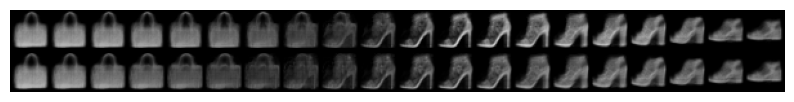

In [8]:
geodesic_grid, linear_grid = get_interpolated_images(
    model=exp.model,
    c_pts=c_pts,
    lin_pts=lin_pts,
    nrow=20,
)
compare_interpolations(geodesic_grid, linear_grid)

In [9]:
# train
sample_idxs = [19853, 44119]

c_pts, lin_pts = compute_geodesic_and_linear(
    model=exp.model,
    sample1=torch.tensor(samples_np[sample_idxs[0]]),
    sample2=torch.tensor(samples_np[sample_idxs[1]]),
)

overlay_geodesic_on_plot(fig=copy(fig), c_pts=c_pts, lin_pts=lin_pts)

Optimizing Geodesic: 100%|██████████| 500/500 [00:36<00:00, 13.63iteration/s]


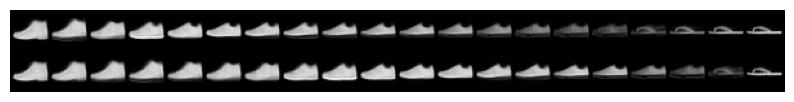

In [10]:
geodesic_grid, linear_grid = get_interpolated_images(
    model=exp.model,
    c_pts=c_pts,
    lin_pts=lin_pts,
    nrow=20,
)
compare_interpolations(geodesic_grid, linear_grid)

In [5]:
sample_idxs = [2829, 551]

c_pts, lin_pts = compute_geodesic_and_linear(
    model=exp.model,
    sample1=torch.tensor(samples_np[sample_idxs[0]]),
    sample2=torch.tensor(samples_np[sample_idxs[1]]),
)

overlay_geodesic_on_plot(fig=copy(fig), c_pts=c_pts, lin_pts=lin_pts)

Optimizing Geodesic:   0%|          | 0/500 [00:00<?, ?iteration/s]

Optimizing Geodesic: 100%|██████████| 500/500 [00:38<00:00, 13.14iteration/s]


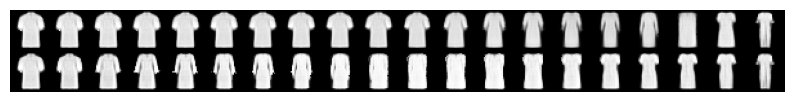

In [6]:
geodesic_grid, linear_grid = get_interpolated_images(
    model=exp.model,
    c_pts=c_pts,
    lin_pts=lin_pts,
    nrow=20,
)
compare_interpolations(geodesic_grid, linear_grid)

---

failure case

In [9]:
sample_idxs = [9081, 5554]

c_pts, lin_pts = compute_geodesic_and_linear(
    model=exp.model,
    sample1=torch.tensor(samples_np[sample_idxs[0]]),
    sample2=torch.tensor(samples_np[sample_idxs[1]]),
)

overlay_geodesic_on_plot(fig=copy(fig), c_pts=c_pts, lin_pts=lin_pts)

Optimizing Geodesic: 100%|██████████| 500/500 [00:47<00:00, 10.48iteration/s]


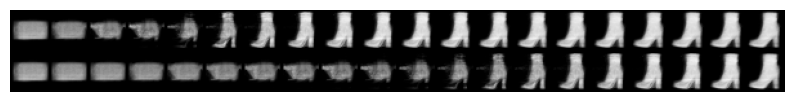

In [10]:
geodesic_grid, linear_grid = get_interpolated_images(
    model=exp.model,
    c_pts=c_pts,
    lin_pts=lin_pts,
    nrow=20,
)
compare_interpolations(geodesic_grid, linear_grid)

---

In [11]:
sample_idxs = [5856, 5650]

c_pts, lin_pts = compute_geodesic_and_linear(
    model=exp.model,
    sample1=torch.tensor(samples_np[sample_idxs[0]]),
    sample2=torch.tensor(samples_np[sample_idxs[1]]),
)

overlay_geodesic_on_plot(fig=copy(fig), c_pts=c_pts, lin_pts=lin_pts)

Optimizing Geodesic: 100%|██████████| 500/500 [00:26<00:00, 18.88iteration/s]


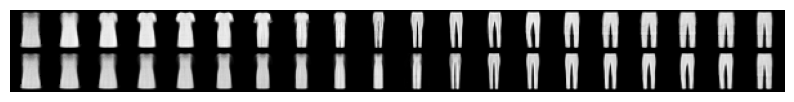

In [12]:
geodesic_grid, linear_grid = get_interpolated_images(
    model=exp.model,
    c_pts=c_pts,
    lin_pts=lin_pts,
    nrow=20,
)
compare_interpolations(geodesic_grid, linear_grid)

---

In [13]:
sample_idxs = [1891, 8394]

c_pts, lin_pts = compute_geodesic_and_linear(
    model=exp.model,
    sample1=torch.tensor(samples_np[sample_idxs[0]]),
    sample2=torch.tensor(samples_np[sample_idxs[1]]),
)

overlay_geodesic_on_plot(fig=copy(fig), c_pts=c_pts, lin_pts=lin_pts)

Optimizing Geodesic: 100%|██████████| 500/500 [00:36<00:00, 13.61iteration/s]


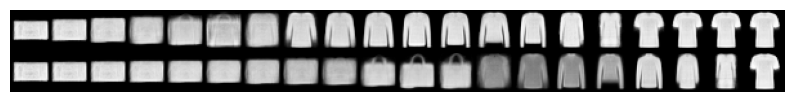

In [14]:
geodesic_grid, linear_grid = get_interpolated_images(
    model=exp.model,
    c_pts=c_pts,
    lin_pts=lin_pts,
    nrow=20,
)
compare_interpolations(geodesic_grid, linear_grid)

---

In [15]:
sample_idxs = [9393, 4045]

c_pts, lin_pts = compute_geodesic_and_linear(
    model=exp.model,
    sample1=torch.tensor(samples_np[sample_idxs[0]]),
    sample2=torch.tensor(samples_np[sample_idxs[1]]),
)

overlay_geodesic_on_plot(fig=copy(fig), c_pts=c_pts, lin_pts=lin_pts)

Optimizing Geodesic: 100%|██████████| 500/500 [00:34<00:00, 14.66iteration/s]


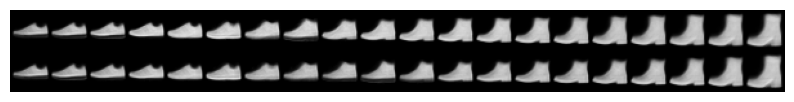

In [16]:
geodesic_grid, linear_grid = get_interpolated_images(
    model=exp.model,
    c_pts=c_pts,
    lin_pts=lin_pts,
    nrow=20,
)
compare_interpolations(geodesic_grid, linear_grid)

---

In [17]:
sample_idxs = [6072, 2742]

c_pts, lin_pts = compute_geodesic_and_linear(
    model=exp.model,
    sample1=torch.tensor(samples_np[sample_idxs[0]]),
    sample2=torch.tensor(samples_np[sample_idxs[1]]),
)

overlay_geodesic_on_plot(fig=copy(fig), c_pts=c_pts, lin_pts=lin_pts)

Optimizing Geodesic: 100%|██████████| 500/500 [00:29<00:00, 16.94iteration/s]


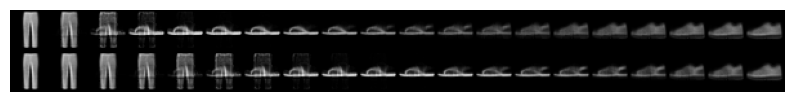

In [18]:
geodesic_grid, linear_grid = get_interpolated_images(
    model=exp.model,
    c_pts=c_pts,
    lin_pts=lin_pts,
    nrow=20,
)
compare_interpolations(geodesic_grid, linear_grid)

---

In [19]:
sample_idxs = [6213, 9282]

c_pts, lin_pts = compute_geodesic_and_linear(
    model=exp.model,
    sample1=torch.tensor(samples_np[sample_idxs[0]]),
    sample2=torch.tensor(samples_np[sample_idxs[1]]),
)

overlay_geodesic_on_plot(fig=copy(fig), c_pts=c_pts, lin_pts=lin_pts)

Optimizing Geodesic: 100%|██████████| 500/500 [01:24<00:00,  5.95iteration/s]


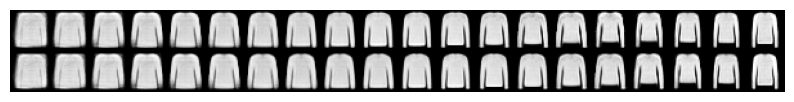

In [21]:
geodesic_grid, linear_grid = get_interpolated_images(
    model=exp.model,
    c_pts=c_pts,
    lin_pts=lin_pts,
    nrow=20,
)
compare_interpolations(geodesic_grid, linear_grid)

---

In [22]:
sample_idxs = [5395, 9112]

c_pts, lin_pts = compute_geodesic_and_linear(
    model=exp.model,
    sample1=torch.tensor(samples_np[sample_idxs[0]]),
    sample2=torch.tensor(samples_np[sample_idxs[1]]),
)

overlay_geodesic_on_plot(fig=copy(fig), c_pts=c_pts, lin_pts=lin_pts)

Optimizing Geodesic: 100%|██████████| 500/500 [00:43<00:00, 11.49iteration/s]


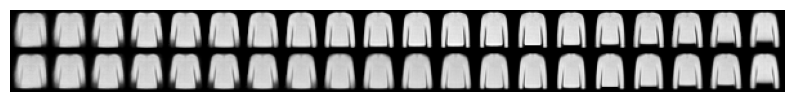

In [23]:
geodesic_grid, linear_grid = get_interpolated_images(
    model=exp.model,
    c_pts=c_pts,
    lin_pts=lin_pts,
    nrow=20,
)
compare_interpolations(geodesic_grid, linear_grid)

---

In [25]:
sample_idxs = [9840, 235]

c_pts, lin_pts = compute_geodesic_and_linear(
    model=exp.model,
    sample1=torch.tensor(samples_np[sample_idxs[0]]),
    sample2=torch.tensor(samples_np[sample_idxs[1]]),
)

overlay_geodesic_on_plot(fig=copy(fig), c_pts=c_pts, lin_pts=lin_pts)

Optimizing Geodesic:   0%|          | 0/500 [00:00<?, ?iteration/s]

Optimizing Geodesic: 100%|██████████| 500/500 [00:20<00:00, 24.78iteration/s]


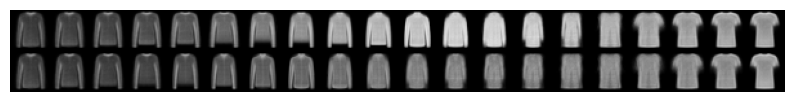

In [26]:
geodesic_grid, linear_grid = get_interpolated_images(
    model=exp.model,
    c_pts=c_pts,
    lin_pts=lin_pts,
    nrow=20,
)
compare_interpolations(geodesic_grid, linear_grid)

In [27]:
sample_idxs = [3718, 9302]

c_pts, lin_pts = compute_geodesic_and_linear(
    model=exp.model,
    sample1=torch.tensor(samples_np[sample_idxs[0]]),
    sample2=torch.tensor(samples_np[sample_idxs[1]]),
)

overlay_geodesic_on_plot(fig=copy(fig), c_pts=c_pts, lin_pts=lin_pts)

Optimizing Geodesic: 100%|██████████| 500/500 [00:30<00:00, 16.52iteration/s]


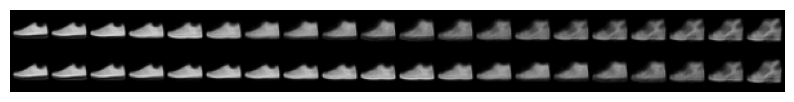

In [28]:
geodesic_grid, linear_grid = get_interpolated_images(
    model=exp.model,
    c_pts=c_pts,
    lin_pts=lin_pts,
    nrow=20,
)
compare_interpolations(geodesic_grid, linear_grid)

---

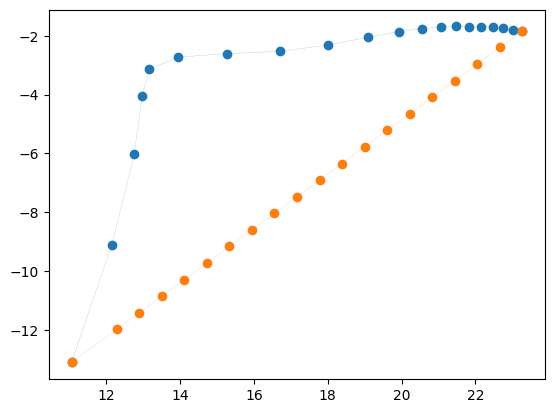

In [13]:
import matplotlib.pyplot as plt

plt.plot(c_pts[:, 0], c_pts[:, 1], linewidth=0.1, marker="o")
plt.plot(lin_pts[:, 0].numpy(), lin_pts[:, 1].numpy(), linewidth=0.1, marker="o")